# Detectron2 Based Resistor Value Reader

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

Welcome to detectron2! I LOVE FaceBook I mean META! Here's a very high-level overview of what's in the flow
* Run instance segmentations on an image of a circuit to extract ALL resistor instance
* Horizontally align all resistors and use INPAINT + CLAHE to remove Glare
* Run another detection model which will identify all instances of colour bands for each resistor instance!



# Get Data


In [1]:
!git clone 'https://github.com/AlexMIaoPU/remote-lab.git'

Cloning into 'remote-lab'...
remote: Enumerating objects: 354, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 354 (delta 0), reused 3 (delta 0), pack-reused 349 (from 1)
Receiving objects: 100% (354/354), 118.94 MiB | 11.80 MiB/s, done.
Resolving deltas: 100% (17/17), done.


In [2]:
!mv -v ./remote-lab/[!.]* ./

renamed './remote-lab/Classifier.py' -> './Classifier.py'
renamed './remote-lab/Colour_band_detection.ipynb' -> './Colour_band_detection.ipynb'
renamed './remote-lab/Copy_of_Detectron2_Tutorial.ipynb' -> './Copy_of_Detectron2_Tutorial.ipynb'
renamed './remote-lab/cropped_1.png' -> './cropped_1.png'
renamed './remote-lab/cropped_2.png' -> './cropped_2.png'
renamed './remote-lab/dataset' -> './dataset'
renamed './remote-lab/extracted_images' -> './extracted_images'
renamed './remote-lab/LossEvalHook.py' -> './LossEvalHook.py'
renamed './remote-lab/Mask.py' -> './Mask.py'
renamed './remote-lab/Processing.py' -> './Processing.py'
renamed './remote-lab/README.md' -> './README.md'
renamed './remote-lab/res1.png' -> './res1.png'
renamed './remote-lab/res2.png' -> './res2.png'
renamed './remote-lab/res3.png' -> './res3.png'
renamed './remote-lab/res4.png' -> './res4.png'
renamed './remote-lab/train_coco.json' -> './train_coco.json'
renamed './remote-lab/val_coco.json' -> './val_coco.json'


# Install detectron2

In [1]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Using cached PyYAML-5.1.tar.gz (274 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
fatal: destination path 'detectron2' already exists and is not an empty directory.
Ignoring dataclasses: markers 'python_version < "3.7"' don't match your environment


In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0
torch:  2.6 ; cuda:  cu124
detectron2: 0.6


In [3]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2.data import transforms as T
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Prepare Config files and load the two models

## Load training datasets to get metadata

In [12]:
from detectron2.data.datasets import register_coco_instances

register_coco_instances("my_dataset_train_seg", {}, "train_coco.json", "dataset/train")

# Now, get the metadata
resistor_meta = MetadataCatalog.get("my_dataset_train_seg")


register_coco_instances("my_dataset_train_detect", {}, "extracted_coco.json", "extracted_images")

# Now, get the metadata
colour_bands_meta = MetadataCatalog.get("my_dataset_train_detect")

In [16]:
print(colour_bands_meta)

Metadata(name='my_dataset_train_detect', json_file='extracted_coco.json', image_root='extracted_images', evaluator_type='coco')


## Create Configs


First, segmentation model

In [6]:
from detectron2.engine import DefaultTrainer

cfg_seg = get_cfg()
cfg_seg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg_seg.DATASETS.TRAIN = ("my_dataset_train_seg")
cfg_seg.DATASETS.TEST = ()
cfg_seg.DATALOADER.NUM_WORKERS = 2
cfg_seg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg_seg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg_seg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg_seg.SOLVER.MAX_ITER = 500    # 500 iterations
cfg_seg.SOLVER.STEPS = []        # do not decay learning rate
cfg_seg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg_seg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.


Next, Detection Model

In [7]:
cfg_detect = get_cfg()
cfg_detect.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg_detect.DATASETS.TRAIN = ("my_dataset_train_detect")
cfg_detect.DATASETS.TEST = ()
cfg_detect.DATALOADER.NUM_WORKERS = 2
cfg_detect.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg_detect.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg_detect.SOLVER.BASE_LR = 0.00005  # pick a good LR
cfg_detect.SOLVER.MAX_ITER = 2000    # 2000 iterations
cfg_detect.SOLVER.STEPS = []        # do not decay learning rate
cfg_detect.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg_detect.MODEL.ROI_HEADS.NUM_CLASSES = 11

## Load the models from model files

In [9]:
seg_model_path = "./model_final3.pth"

cfg_seg.MODEL.WEIGHTS = seg_model_path  # path to the model we have uploaded/downloaded
cfg_seg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9   # set a custom testing threshold
predictor_seg = DefaultPredictor(cfg_seg)

[05/28 06:36:04 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./model_final3.pth ...


In [10]:
detection_model_path = "./model_final.pth"

cfg_detect.MODEL.WEIGHTS = detection_model_path  # path to the model we have uploaded/downloaded
cfg_detect.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor_detect = DefaultPredictor(cfg_detect)

[05/28 06:36:06 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./model_final.pth ...


## Inference & evaluation using the trained model



Run inference on samples from the training dataset

In [ ]:
from detectron2.data.datasets import load_coco_json # Import the load_coco_json function
from detectron2.utils.visualizer import ColorMode
from PIL import Image
from Mask import extract_instance
from Processing import image_horitzontal_alignment, remove_glare

dataset_dicts = load_coco_json("train_coco.json", "dataset/train")

for d in random.sample(dataset_dicts, 2):

    im = cv2.imread(d["file_name"])

    # Run the segmentation model
    outputs = predictor_seg(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=resistor_meta,
                   scale=1,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

    # Get the masks
    masks = np.asarray(outputs["instances"].pred_masks.to("cpu"))

    # for each mask, extract the instance and process it, then run detection model on it
    for i, item_mask in enumerate(masks):

        extracted_image = extract_instance(item_mask, im)

        rotated = image_horitzontal_alignment(np.array(extracted_image))

        image_without_glare = remove_glare(rotated)

        outputs = predictor_detect(image_without_glare)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
        v = Visualizer(image_without_glare[:, :, ::-1],
                        metadata=colour_bands_meta,
                        scale=1,
                        instance_mode=ColorMode.IMAGE
        )
        out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
        cv2_imshow(out.get_image()[:, :, ::-1])

# Operate on an image never seen before

/usr/local/lib/python3.11/dist-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


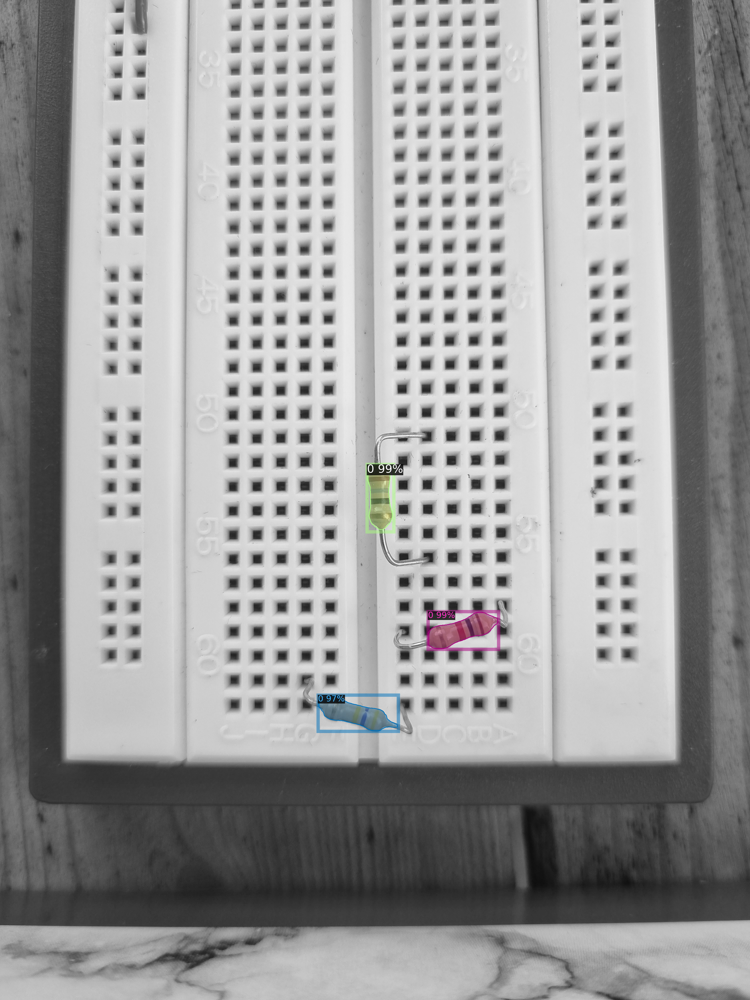

1712 1991 2448 2595


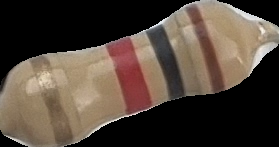

Theta: -0.3300540185567795


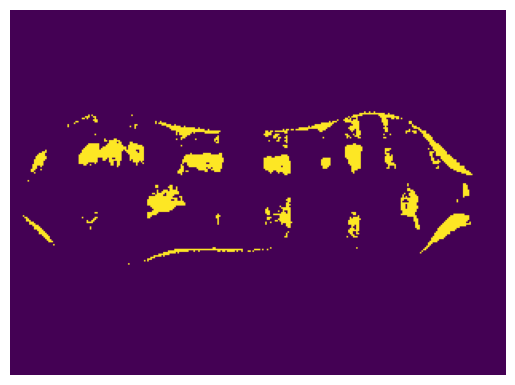

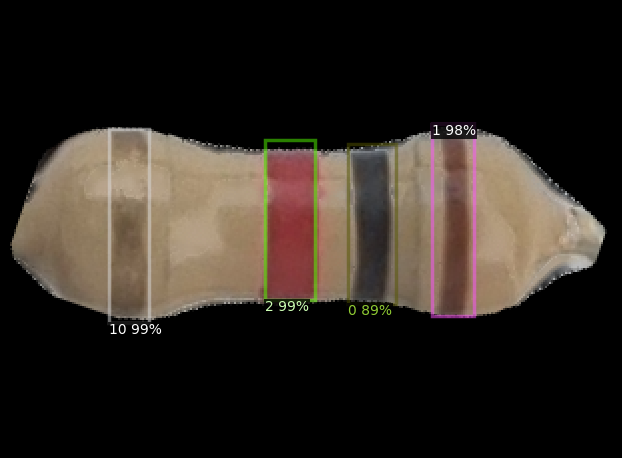

1470 1569 1858 2118


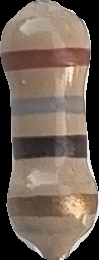

Theta: 1.5269093917255232


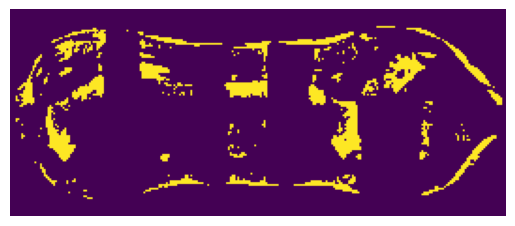

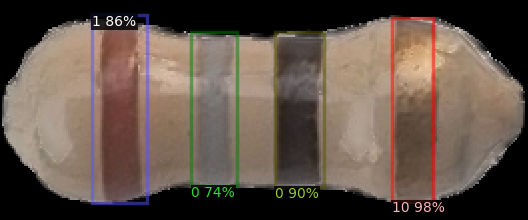

1273 1589 2786 2924


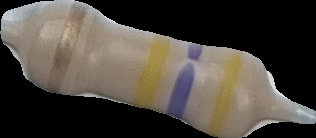

Theta: 0.2824618923105975


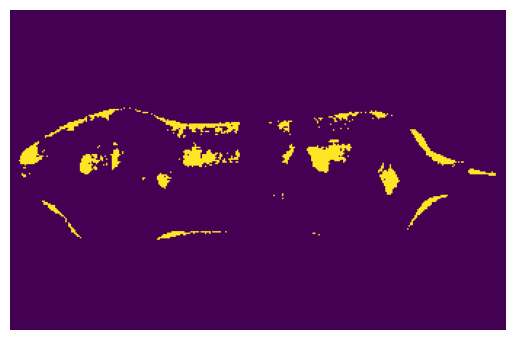

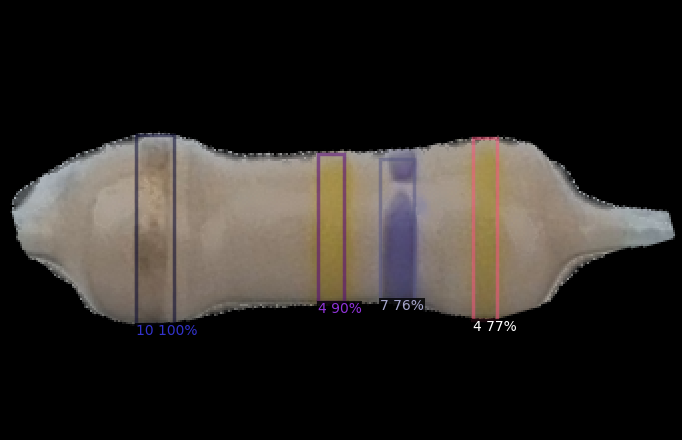

In [11]:
from detectron2.utils.visualizer import ColorMode
from PIL import Image
from Mask import extract_instance
from Processing import image_horitzontal_alignment, remove_glare
from Grid import grid_generation, get_masked_grid_points

# Choose an image path
image_path = "./sample.jpg"

im = cv2.imread(image_path)

# Run the segmentation model
outputs = predictor_seg(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v_seg = Visualizer(im[:, :, ::-1],
                metadata=resistor_meta,
                scale=1,
                instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
)
out = v_seg.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

# Get the masks
masks = np.asarray(outputs["instances"].pred_masks.to("cpu"))

# for each mask, extract the instance and process it, then run detection model on it
for i, item_mask in enumerate(masks):

    extracted_image = extract_instance(item_mask, im)

    rotated = image_horitzontal_alignment(np.array(extracted_image))

    image_without_glare = remove_glare(rotated)

    outputs_detect = predictor_detect(image_without_glare)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v_detect = Visualizer(image_without_glare[:, :, ::-1],
                    metadata=colour_bands_meta,
                    scale=2,
                    instance_mode=ColorMode.IMAGE
    )
    detection_out = v_detect.draw_instance_predictions(outputs_detect["instances"].to("cpu"))
    cv2_imshow(detection_out.get_image()[:, :, ::-1])

# Run Grid generation
intersections, grid_size, row_count, col_count = grid_generation(im)

# Show all mask covered grid points
masked_grid_points = get_masked_grid_points(intersections, masks)
# (Optional) Visualize covered grid points for each resistor mask
vis_img = im.copy()
for covered_points in masked_grid_points:
    for pt in covered_points:
        x, y = int(round(pt.x)), int(round(pt.y))
        cv2.circle(vis_img, (x, y), 4, (0, 255, 255), -1)  # yellow
cv2_imshow(vis_img)

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[05/23 07:45:58 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[05/23 07:45:58 d2.data.datasets.coco]: Loaded 27 images in COCO format from val_coco.json
[05/23 07:45:58 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/23 07:45:58 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/23 07:45:58 d2.data.common]: Serializing 27 elements to byte tensors and concatenating them all ...
[05/23 07:45:58 d2.data.common]: Serialized dataset takes 0.01 MiB
[05/23 07:45:58 d2.evaluation.evaluator]: Start inference on 27 batches
[05/23 07:46:00 d2.evaluation.evaluator]: Inference done 11/27. Dataloading: 0.0013 s/iter. Inference: 0.1029 s/iter. Eval: 0.0013 s/iter. Total: 0.1055 s/iter. ETA=0:00:01
[05/23 07:46:02 d2.evaluation.evaluator]: Total inference time: 0:00:02.629872 (0.1